In [237]:
import pandas as pd
color = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
color.head()

,Blue,Green,Red,Distance,Light,Color,ColorDetect,ColorNum
0,41.15,24.42,34.44,3,1,Blue,Yes,1
1,40.43,24.92,34.65,3,1,Blue,Yes,1
2,40.84,24.63,34.53,3,1,Blue,Yes,1
3,41.20,24.37,34.43,3,1,Blue,Yes,1
4,40.97,24.54,34.49,3,1,Blue,Yes,1


In [238]:
from sklearn.linear_model import LogisticRegression
predictors = ['Distance', 'Light', 'Blue','Green','Red']
X = color[predictors]
y = color.ColorNum

clf = LogisticRegression(random_state=0, multi_class='multinomial', solver='newton-cg')
model = clf.fit(X, y)
print(model)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=0, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)


In [239]:
print('classes:', model.classes_)
print('coefficients:', model.coef_)
print('intercept:', model.intercept_)

classes: [0 1]
coefficients: [[ 0.07105542 -2.29980015  0.00915525 -0.00940714  0.01102252]]
intercept: [1.26883279]


In [240]:
model.predict(X)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [241]:
import statsmodels.api as sm
predictors = ['Blue','Green','Red', 'Distance', 'Light']
X = df[predictors]
Y = df.ColorDetect

In [242]:
#create a new column for response 'Direction' with the values True/False
df['ColorDetect_boolean'] = df['ColorDetect'] == 'Yes'

#use the Logit function to do logistic regression
logit = sm.Logit(df['ColorDetect_boolean'], X)

# fit the model
result = logit.fit()
print (result.summary())

         Current function value: 0.270678
         Iterations: 35
                            Logit Regression Results                           
Dep. Variable:     ColorDetect_boolean   No. Observations:                  477
Model:                           Logit   Df Residuals:                      472
Method:                            MLE   Df Model:                            4
Date:                 Thu, 12 Dec 2019   Pseudo R-squ.:                  0.4375
Time:                         23:58:28   Log-Likelihood:                -129.11
converged:                       False   LL-Null:                       -229.55
Covariance Type:             nonrobust   LLR p-value:                 2.447e-42
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Blue           7.7341     27.574      0.280      0.779     -46.310      61.778
Green          7.6852     27.574      0.279      0.780   

C:\Users\Hamed\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [243]:
#calculate y1 = log(p(X)).(1-p(X)) = B0 + B1 * X
coef = model1.params
# pick data from any row and calculate y1
Blue = 33.22
Green = 28.87
Red = 37.91
Distance = 6
Light = 1
y1= coef[0] + Blue + coef[1] * Green + coef[2] * Red + coef[3] * Distance + coef[4] * Light
y1

-216.35626024975568

In [244]:
# Find the probability using the logistic function p = e^y1/(1+e^y1)
import numpy as np
p = np.exp(y1)/(1+np.exp(y1))
p # this is the probability using our logistic regression model that predicted Direction is 'Yes'

1.0906114384634123e-94

In [245]:
# Find the probability using the logistic function p = e^y1/(1+e^y1)
import numpy as np
p = np.exp(y1)/(1+np.exp(y1))
p # this is the probability using our logistic regression model that predicted Direction is 'Yes'

1.0906114384634123e-94

In [246]:
# Split into training and test sets
x_train, x_test , y_train, y_test = model_selection.train_test_split(X, Y, test_size=0.3, random_state=1)

In [247]:
# perform linear discriminant analysis
lda = da.LinearDiscriminantAnalysis()

# fit on training data and predict on test data
y_pred = lda.fit(x_train, y_train).predict(x_test)

In [248]:
# calcalte the priors, that is, probability of observations belonging to 'Up' or 'Down' class
lda.priors_

array([0.18918919, 0.81081081])

In [249]:
# calculate the means (see equation 4.15 for means)
lda.means_

array([[28.60269841, 32.44238095, 38.95555556,  9.80952381,  1.        ],
       [38.59577778, 26.19792593, 35.20625926, 14.82222222,  0.39259259]])

In [250]:
lda.coef_

array([[-6.48314625, -6.49736805, -6.48319363,  0.1614848 , -3.564522  ]])

In [251]:
from sklearn import metrics
#generates the confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[ 17,   9],
       [ 15, 103]], dtype=int64)

In [252]:
from sklearn import metrics
print(metrics.classification_report(y_test, y_pred)) # prints out precision, recall, f1-score, support

              precision    recall  f1-score   support

          No       0.53      0.65      0.59        26
         Yes       0.92      0.87      0.90       118

    accuracy                           0.83       144
   macro avg       0.73      0.76      0.74       144
weighted avg       0.85      0.83      0.84       144



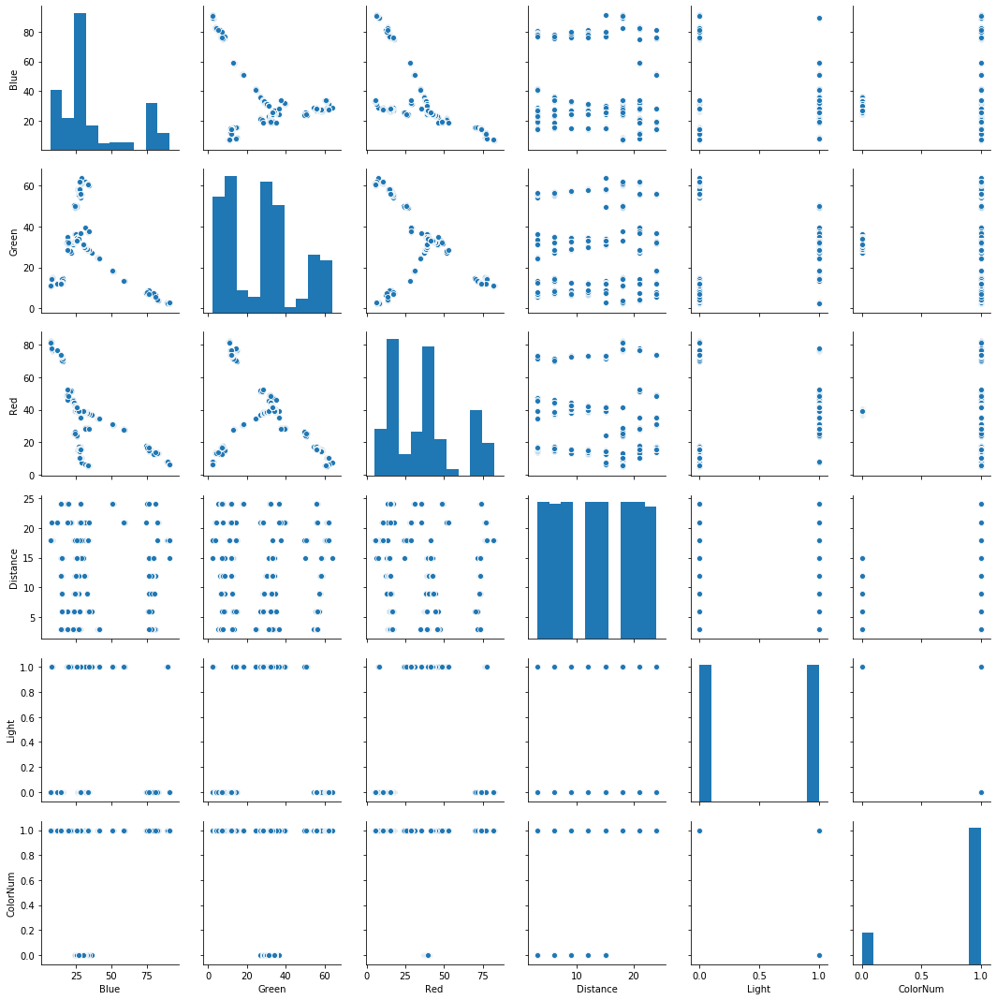

In [109]:
import seaborn as sns
sns.pairplot(df)

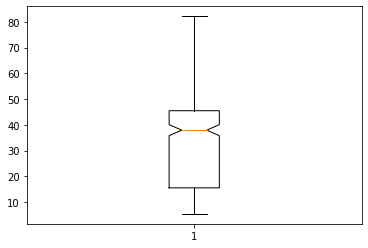

In [110]:
import matplotlib.pyplot as plt
#boxplot for predictor Red and response ColorNum
plt.boxplot(df.Red, [df.ColorNum])
plt.show()

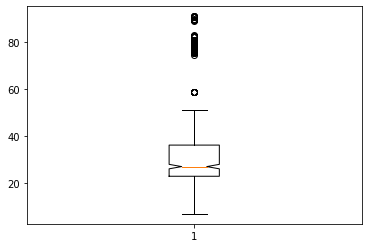

In [111]:
import matplotlib.pyplot as plt
#boxplot for predictor Blue and response ColorNum
plt.boxplot(df.Blue, [df.ColorNum])
plt.show()

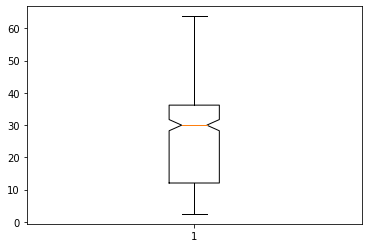

In [112]:
import matplotlib.pyplot as plt
#boxplot for predictor Green and response ColorNum
plt.boxplot(df.Green, [df.ColorNum])
plt.show()

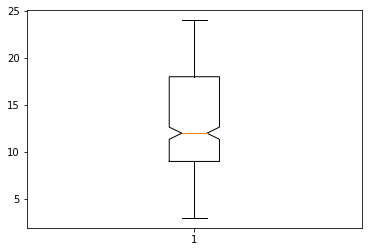

In [113]:
import matplotlib.pyplot as plt
#boxplot for predictor Distance and response ColorNum
plt.boxplot(df.Distance, [df.ColorNum])
plt.show()

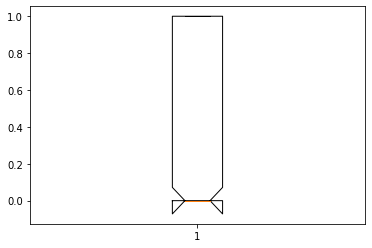

In [114]:
import matplotlib.pyplot as plt
#boxplot for predictor Light and response ColorNum
plt.boxplot(df.Light, [df.ColorNum])
plt.show()

In [117]:
#kfold validation
from sklearn.model_selection import RepeatedKFold
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
kfold = RepeatedKFold(n_splits=3, n_repeats=3, random_state=None)
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df.head()
X = np.array(df.Light, df.Blue)
y = np.array(df.ColorNum)

for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train = X[train_index].reshape(-1,1)
    X_test = X[test_index].reshape(-1,1)
    y_train = y[train_index]
    y_test = y[test_index]
    print('X train',X_train)
    print('X test',X_test)
    print('Y train',y_train)
    print('Y test',y_test)
    
logit = LogisticRegression()
model = logit.fit(X_train, y_train)
print (logit)
# View the R-Squared score
print(model.score(X_test, y_test))
((y_test - model.predict(X_test)) **2).sum()
# Calculate the MSE
MSE1 = np.mean((model.predict(X_test) - y_test) **2)
print('MSE 1 =', MSE1)

Train index: [  0   1   2   3   4   6   7   8   9  10  13  14  16  17  19  21  22  24
  25  26  27  28  29  30  32  33  34  39  40  41  44  45  47  48  49  51
  53  54  55  57  58  59  60  62  64  65  68  69  70  71  72  74  75  76
  77  79  81  83  85  86  88  89  90  91  92  93  94  99 102 103 104 105
 106 107 109 111 114 115 119 121 122 123 125 126 127 128 129 130 131 132
 133 134 135 137 138 139 140 141 145 146 147 149 151 153 154 155 158 160
 161 162 163 167 168 169 170 171 174 175 176 178 179 180 182 183 184 186
 187 188 189 191 192 195 196 197 198 199 200 201 204 205 206 207 209 211
 212 215 216 218 219 220 223 224 226 227 230 232 234 236 238 239 240 241
 242 243 244 245 246 247 250 251 252 253 254 255 257 258 261 262 263 265
 266 267 268 270 271 275 276 278 279 280 281 282 284 285 287 288 289 290
 291 292 293 296 297 298 299 301 303 304 306 308 309 310 311 315 316 317
 319 324 325 326 327 328 330 334 335 336 337 338 339 340 342 343 344 347
 348 349 350 351 352 354 356 357 358 3

In [118]:
from sklearn import metrics
import sklearn.discriminant_analysis as da

#X_train = X_train.values.reshape(-1, 1)
#y_train = y_train.values.reshape(-1, 1)
#X_test = X_test.values.reshape(-1, 1)
#y_test = y_test.values.reshape(-1, 1)
lda = da.LinearDiscriminantAnalysis()

# fit on training data and predict on test data
y_pred = lda.fit(X_train, y_train.ravel()).predict(X_test)

print(metrics.classification_report(y_test, y_pred)) # prints out precision, recall, f1-score, support
#generates the confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        28
           1       0.82      1.00      0.90       131

    accuracy                           0.82       159
   macro avg       0.41      0.50      0.45       159
weighted avg       0.68      0.82      0.74       159



C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[  0,  28],
       [  0, 131]], dtype=int64)

In [119]:
#kfold validation
from sklearn.model_selection import RepeatedKFold
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
kfold = RepeatedKFold(n_splits=3, n_repeats=3, random_state=None)
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df.head()
X = np.array(df.Light, df.Red)
y = np.array(df.ColorNum)

for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train = X[train_index].reshape(-1,1)
    X_test = X[test_index].reshape(-1,1)
    y_train = y[train_index]
    y_test = y[test_index]
    print('X train',X_train)
    print('X test',X_test)
    print('Y train',y_train)
    print('Y test',y_test)
    
logit = LogisticRegression()
model = logit.fit(X_train, y_train)
print (logit)
# View the R-Squared score
print(model.score(X_test, y_test))
((y_test - model.predict(X_test)) **2).sum()
# Calculate the MSE
MSE1 = np.mean((model.predict(X_test) - y_test) **2)
print('MSE 1 =', MSE1)

Train index: [  0   3   4   7  11  12  13  14  15  16  18  19  20  21  22  23  24  27
  28  29  30  33  34  35  37  38  39  40  42  43  44  46  48  51  52  54
  55  56  57  59  63  64  65  68  69  70  71  72  73  74  75  76  77  78
  81  82  83  84  85  86  87  88  89  91  92  93  94  96  99 100 101 102
 103 105 107 109 110 111 112 113 114 115 116 117 120 121 122 124 125 126
 127 128 129 130 133 134 136 138 139 140 141 142 144 145 148 150 151 153
 154 155 156 157 158 159 161 162 163 169 171 172 173 174 177 178 183 184
 187 188 189 190 196 197 198 199 200 203 204 205 208 210 211 212 213 215
 217 218 219 220 221 222 225 226 227 229 230 232 234 235 240 243 244 246
 247 248 249 250 251 254 255 256 258 260 262 264 265 266 267 268 269 270
 271 273 274 277 279 280 281 282 284 285 286 288 289 290 292 297 298 299
 301 302 303 304 305 306 307 308 309 311 312 313 314 315 317 323 325 326
 327 328 329 330 332 333 335 336 337 338 339 344 345 346 347 348 350 351
 353 354 356 357 358 361 362 363 364 3

In [120]:
from sklearn import metrics
import sklearn.discriminant_analysis as da

#X_train = X_train.values.reshape(-1, 1)
#y_train = y_train.values.reshape(-1, 1)
#X_test = X_test.values.reshape(-1, 1)
#y_test = y_test.values.reshape(-1, 1)
lda = da.LinearDiscriminantAnalysis()

# fit on training data and predict on test data
y_pred = lda.fit(X_train, y_train.ravel()).predict(X_test)

print(metrics.classification_report(y_test, y_pred)) # prints out precision, recall, f1-score, support
#generates the confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        22
           1       0.86      1.00      0.93       137

    accuracy                           0.86       159
   macro avg       0.43      0.50      0.46       159
weighted avg       0.74      0.86      0.80       159



C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[  0,  22],
       [  0, 137]], dtype=int64)

In [274]:
# LOOCV validation
from sklearn.model_selection import LeaveOneOut
import numpy as np
import pandas as pd

# if you are reading data from a file, you can create arrays X and y as shown below:
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df.head()
X = np.array(df.Light, df.Green)
y = np.array(df.ColorNum)

loocv = LeaveOneOut()
loocv.get_n_splits(X)

for train_index, test_index in loocv.split(X):
        print("train index:", train_index, "validation index:", test_index)
        X_train, X_test = X[train_index].reshape(-1,1), X[test_index].reshape(-1,1)
        y_train, y_test = y[train_index], y[test_index]
        print('train',X_train)
        print('test',X_test)
        print('Y train',y_train)
        print('Y test',y_test)
        
logit = LogisticRegression()
model = logit.fit(X_train, y_train)
print (logit)
# View the R-Squared score
print(model.score(X_test, y_test))
((y_test - model.predict(X_test)) **2).sum()
# Calculate the MSE
MSE1 = np.mean((model.predict(X_test) - y_test) **2)
print('MSE 1 =', MSE1)

train index: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242 243 2

In [121]:
#kfold validation
from sklearn.model_selection import RepeatedKFold
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
kfold = RepeatedKFold(n_splits=3, n_repeats=3, random_state=None)
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df.head()
X = np.array(df.Light, df.Green)
y = np.array(df.ColorNum)

for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train = X[train_index].reshape(-1,1)
    X_test = X[test_index].reshape(-1,1)
    y_train = y[train_index]
    y_test = y[test_index]
    print('X train',X_train)
    print('X test',X_test)
    print('Y train',y_train)
    print('Y test',y_test)
    
logit = LogisticRegression()
model = logit.fit(X_train, y_train)
print (logit)
# View the R-Squared score
print(model.score(X_test, y_test))
((y_test - model.predict(X_test)) **2).sum()
# Calculate the MSE
MSE1 = np.mean((model.predict(X_test) - y_test) **2)
print('MSE 1 =', MSE1)

Train index: [  0   3   4   5   6   7   8   9  11  12  13  14  15  16  19  20  22  23
  24  25  26  28  29  30  31  32  34  35  37  40  41  42  43  44  48  49
  50  51  55  56  59  60  62  64  65  66  67  68  69  71  73  74  77  78
  79  80  81  83  84  85  86  89  90  91  92  93  96  97  98  99 100 101
 102 104 106 107 108 109 110 111 113 117 118 119 120 121 126 128 129 132
 133 134 135 136 137 140 142 144 145 146 147 148 149 150 151 152 154 155
 156 157 158 160 161 163 167 170 172 173 174 176 179 180 181 182 183 185
 186 188 189 193 195 196 197 198 199 201 203 204 206 207 210 211 212 214
 215 216 218 219 221 222 224 225 226 230 232 235 236 237 238 239 242 243
 245 246 248 250 251 252 253 254 255 257 258 259 261 262 263 265 267 269
 270 272 275 276 277 279 280 281 284 285 287 288 291 292 294 296 297 298
 299 301 302 306 307 308 309 310 311 314 316 317 319 320 323 325 326 327
 328 329 330 331 333 334 336 338 339 341 342 344 345 346 347 348 350 352
 353 355 356 357 358 359 362 364 365 3

In [122]:
from sklearn import metrics
import sklearn.discriminant_analysis as da

#X_train = X_train.values.reshape(-1, 1)
#y_train = y_train.values.reshape(-1, 1)
#X_test = X_test.values.reshape(-1, 1)
#y_test = y_test.values.reshape(-1, 1)
lda = da.LinearDiscriminantAnalysis()

# fit on training data and predict on test data
y_pred = lda.fit(X_train, y_train.ravel()).predict(X_test)

print(metrics.classification_report(y_test, y_pred)) # prints out precision, recall, f1-score, support
#generates the confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.84      1.00      0.91       134

    accuracy                           0.84       159
   macro avg       0.42      0.50      0.46       159
weighted avg       0.71      0.84      0.77       159



C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[  0,  25],
       [  0, 134]], dtype=int64)

In [275]:
# LOOCV validation
from sklearn.model_selection import LeaveOneOut
import numpy as np
import pandas as pd

# if you are reading data from a file, you can create arrays X and y as shown below:
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df.head()
X = np.array(df.Light, df.Distance)
y = np.array(df.ColorNum)

loocv = LeaveOneOut()
loocv.get_n_splits(X)

for train_index, test_index in loocv.split(X):
        print("train index:", train_index, "validation index:", test_index)
        X_train, X_test = X[train_index].reshape(-1,1), X[test_index].reshape(-1,1)
        y_train, y_test = y[train_index], y[test_index]
        print('train',X_train)
        print('test',X_test)
        print('Y train',y_train)
        print('Y test',y_test)
        
logit = LogisticRegression()
model = logit.fit(X_train, y_train)
print (logit)
# View the R-Squared score
print(model.score(X_test, y_test))
((y_test - model.predict(X_test)) **2).sum()
# Calculate the MSE
MSE1 = np.mean((model.predict(X_test) - y_test) **2)
print('MSE 1 =', MSE1)

train index: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242 243 2

In [123]:
#kfold validation
from sklearn.model_selection import RepeatedKFold
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
kfold = RepeatedKFold(n_splits=3, n_repeats=3, random_state=None)
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df.head()
X = np.array(df.Light, df.Distance)
y = np.array(df.ColorNum)

for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train = X[train_index].reshape(-1,1)
    X_test = X[test_index].reshape(-1,1)
    y_train = y[train_index]
    y_test = y[test_index]
    print('X train',X_train)
    print('X test',X_test)
    print('Y train',y_train)
    print('Y test',y_test)
    
logit = LogisticRegression()
model = logit.fit(X_train, y_train)
print (logit)
# View the R-Squared score
print(model.score(X_test, y_test))
((y_test - model.predict(X_test)) **2).sum()
# Calculate the MSE
MSE1 = np.mean((model.predict(X_test) - y_test) **2)
print('MSE 1 =', MSE1)

Train index: [  1   3   4   7   8   9  10  11  12  13  14  15  16  18  20  23  24  27
  31  32  33  35  38  39  40  42  44  45  46  47  48  51  52  53  56  57
  59  60  61  62  65  66  68  69  71  72  73  74  79  80  81  82  83  87
  88  90  92  94  95  96  97  99 102 105 106 107 108 109 110 112 113 115
 116 117 118 119 123 124 126 129 130 131 132 135 136 137 140 141 143 144
 147 148 149 150 151 152 153 158 159 160 161 162 167 173 174 175 176 177
 179 180 181 184 185 191 195 196 198 199 202 203 204 205 206 207 210 212
 213 216 217 218 219 220 221 223 225 226 227 228 229 230 231 232 233 234
 235 237 238 240 241 242 243 246 247 248 249 251 253 254 255 257 258 259
 260 261 262 265 267 270 271 272 273 274 275 276 277 278 279 280 281 282
 284 285 286 287 288 289 290 292 293 294 295 304 307 308 309 311 312 313
 315 318 319 322 323 324 329 331 333 334 335 336 337 338 339 340 341 344
 345 346 348 349 351 352 353 354 355 356 357 358 360 361 362 365 366 368
 369 370 371 372 374 375 377 378 379 3

In [124]:
from sklearn import metrics
import sklearn.discriminant_analysis as da

#X_train = X_train.values.reshape(-1, 1)
#y_train = y_train.values.reshape(-1, 1)
#X_test = X_test.values.reshape(-1, 1)
#y_test = y_test.values.reshape(-1, 1)
lda = da.LinearDiscriminantAnalysis()

# fit on training data and predict on test data
y_pred = lda.fit(X_train, y_train.ravel()).predict(X_test)

print(metrics.classification_report(y_test, y_pred)) # prints out precision, recall, f1-score, support
#generates the confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        24
           1       0.85      1.00      0.92       135

    accuracy                           0.85       159
   macro avg       0.42      0.50      0.46       159
weighted avg       0.72      0.85      0.78       159



C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[  0,  24],
       [  0, 135]], dtype=int64)

In [125]:
import numpy as np 
import pandas as pd 
from sklearn.metrics import confusion_matrix 
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

In [126]:
# Function importing Dataset for Decision Tree Modeling
def importdata(): 
    balance_data = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv', index_col=[0]) 

        # Printing the dataswet shape 
    print ("Dataset Length: ", len(balance_data)) 
    print ("Dataset Shape: ", balance_data.shape) 

        # Printing the dataset obseravtions 
    print ("Dataset: ",balance_data.head()) 
    return balance_data 

In [127]:
# Function to split the dataset 
def splitdataset(balance_data): 
  
    # Separating the target variable 
    X = balance_data.values[:, 2:3] 
    Y = balance_data.values[:, 5] 
  
    # Splitting the dataset into train and test 
    X_train, X_test, y_train, y_test = train_test_split(  
    X, Y, test_size = 0.3, random_state = 100) 
      
    return X, Y, X_train, X_test, y_train, y_test 
      
# Function to perform training with giniIndex. 
def train_using_gini(X_train, X_test, y_train): 
  
    # Creating the classifier object 
    clf_gini = DecisionTreeClassifier(criterion = "gini", 
            random_state = 100,max_depth=3, min_samples_leaf=5) 
  
    # Performing training 
    clf_gini.fit(X_train, y_train) 
    return clf_gini 
      
# Function to perform training with entropy. 
def tarin_using_entropy(X_train, X_test, y_train): 
  
    # Decision tree with entropy 
    clf_entropy = DecisionTreeClassifier( 
            criterion = "entropy", random_state = 100, 
            max_depth = 3, min_samples_leaf = 5) 
  
    # Performing training 
    clf_entropy.fit(X_train, y_train) 
    return clf_entropy 
  
  
# Function to make predictions 
def prediction(X_test, clf_object): 
  
    # Predicton on test with giniIndex 
    y_pred = clf_object.predict(X_test) 
    print("Predicted values:") 
    print(y_pred) 
    return y_pred 
      
# Function to calculate accuracy 
def cal_accuracy(y_test, y_pred): 
      
    print("Confusion Matrix: ", 
        confusion_matrix(y_test, y_pred)) 
      
    print ("Accuracy : ", 
    accuracy_score(y_test,y_pred)*100) 
      
    print("Report : ", 
    classification_report(y_test, y_pred)) 
  
# Driver code 
def main(): 
      
    # Building Phase 
    data = importdata() 
    X, Y, X_train, X_test, y_train, y_test = splitdataset(data) 
    clf_gini = train_using_gini(X_train, X_test, y_train) 
    clf_entropy = tarin_using_entropy(X_train, X_test, y_train) 
      
    # Operational Phase 
    print("Results Using Gini Index:") 
      
    # Prediction using gini 
    y_pred_gini = prediction(X_test, clf_gini) 
    cal_accuracy(y_test, y_pred_gini) 
      
    print("Results Using Entropy:") 
    # Prediction using entropy 
    y_pred_entropy = prediction(X_test, clf_entropy) 
    cal_accuracy(y_test, y_pred_entropy) 
      
      
# Calling main function 
if __name__=="__main__": 
    main()

Dataset Length:  477
Dataset Shape:  (477, 7)
Dataset:         Green    Red  Distance  Light Color ColorDetect  ColorNum
Blue                                                            
41.15  24.42  34.44         3      1  Blue         Yes         1
40.43  24.92  34.65         3      1  Blue         Yes         1
40.84  24.63  34.53         3      1  Blue         Yes         1
41.20  24.37  34.43         3      1  Blue         Yes         1
40.97  24.54  34.49         3      1  Blue         Yes         1
Results Using Gini Index:
Predicted values:
['Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes'
 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes'
 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes'
 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes'
 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes'
 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes' 'Yes'
 'Yes' 

C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [128]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RepeatedKFold 
from sklearn.model_selection import cross_val_score
from sklearn import metrics
import pandas as pd 
import numpy as np

df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')


# response
y = np.array(df.ColorNum)



# all remaining columns X0, X1, ... are predictors
#X1 = df.drop(['Blue'], axis=1)
#X1 = df.drop(['Green'], axis = 1)
#X1 = df.drop(['Red'], axis = 1)
#X1 = df.drop(['Color'], axis = 1)
#X1 = df.drop(['ColorDetect'], axis = 1)
X = np.array(df.Light, df.Blue)

accuracies = []

kfold = RepeatedKFold(n_splits=5, n_repeats=1, random_state=None) 
for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train, X_test = X[train_index].reshape(-1,1), X[test_index].reshape(-1,1) 
    y_train, y_test = y[train_index].reshape(-1,1), y[test_index]
    clf = DecisionTreeClassifier(max_depth=10)
    clf.fit(X_train,y_train)
    y_preds = clf.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_preds)    
    accuracies.append(accuracy)

print(accuracies)

# The for loop shown above and can be replaced with the single statement below. The cross_val_score method takes the classifier as the first
# argument, X and y as the second and third arguments, and the type of cross validation (kfold in this example). It automatically
# splits the dataset into training and test sets and calculates the accuracy of the classifier.
print(cross_val_score(clf, X, y, cv=kfold))    



Train index: [  1   2   3   4   6   7  10  11  12  13  14  16  17  18  19  20  21  22
  23  24  25  26  27  28  29  30  32  33  35  36  37  38  39  40  42  43
  44  45  46  48  49  50  51  54  55  56  57  58  59  60  61  63  64  65
  66  68  69  70  72  74  75  76  77  79  81  84  85  86  88  89  91  92
  94  96  97  98  99 100 101 103 105 106 107 108 109 110 111 113 114 116
 117 118 119 120 121 122 124 125 126 127 128 129 130 131 132 134 136 138
 141 142 143 144 145 146 148 149 150 151 152 156 157 158 159 161 162 164
 165 166 167 170 172 173 176 179 182 183 186 187 190 191 192 194 196 197
 198 199 200 202 203 204 205 206 207 208 209 210 211 213 214 215 216 218
 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236
 237 238 239 240 241 243 244 245 246 247 248 250 251 252 253 254 255 257
 258 259 260 261 264 265 267 268 269 270 272 273 274 275 276 277 278 279
 280 282 284 285 286 287 288 289 290 292 293 294 296 297 298 299 300 301
 302 304 305 306 307 309 310 312 313 3

C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Expected 2D array, got 1D array instead:
array=[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [129]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RepeatedKFold 
from sklearn.model_selection import cross_val_score
from sklearn import metrics
import pandas as pd 
import numpy as np

df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')


# response
y = np.array(df.ColorNum)



# all remaining columns X0, X1, ... are predictors
#X1 = df.drop(['Blue'], axis=1)
#X1 = df.drop(['Green'], axis = 1)
#X1 = df.drop(['Red'], axis = 1)
#X1 = df.drop(['Color'], axis = 1)
#X1 = df.drop(['ColorDetect'], axis = 1)
X = np.array(df.Light, df.Green)

accuracies = []

kfold = RepeatedKFold(n_splits=5, n_repeats=1, random_state=None) 
for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train, X_test = X[train_index].reshape(-1,1), X[test_index].reshape(-1,1) 
    y_train, y_test = y[train_index].reshape(-1,1), y[test_index]
    clf = DecisionTreeClassifier(max_depth=10)
    clf.fit(X_train,y_train)
    y_preds = clf.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_preds)    
    accuracies.append(accuracy)

print(accuracies)

# The for loop shown above and can be replaced with the single statement below. The cross_val_score method takes the classifier as the first
# argument, X and y as the second and third arguments, and the type of cross validation (kfold in this example). It automatically
# splits the dataset into training and test sets and calculates the accuracy of the classifier.
print(cross_val_score(clf, X, y, cv=kfold))    



Train index: [  0   1   2   3   4   5   7   9  11  13  15  16  17  19  21  22  24  25
  26  27  28  29  30  31  32  33  34  35  36  37  39  40  41  43  44  46
  47  48  49  50  51  53  54  55  56  57  59  60  61  62  63  64  65  66
  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84
  85  86  87  88  89  90  91  92  94  96  97  98  99 101 102 103 104 105
 106 108 109 110 111 112 113 115 116 118 121 122 123 124 125 126 127 128
 129 130 131 132 133 136 137 138 139 140 142 147 148 149 150 151 152 154
 156 157 158 159 160 161 162 163 164 165 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 187 188 189 191 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 210 211 212 213 214 217 218 219
 220 221 222 224 225 226 227 229 230 231 232 233 234 235 236 237 241 242
 243 244 245 246 248 249 250 252 253 255 256 257 258 260 262 263 264 265
 266 268 270 272 273 274 275 276 278 279 280 281 282 283 284 285 286 287
 289 290 291 292 293 294 296 297 299 3

C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Expected 2D array, got 1D array instead:
array=[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [130]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RepeatedKFold 
from sklearn.model_selection import cross_val_score
from sklearn import metrics
import pandas as pd 
import numpy as np

df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')


# response
y = np.array(df.ColorNum)



# all remaining columns X0, X1, ... are predictors
#X1 = df.drop(['Blue'], axis=1)
#X1 = df.drop(['Green'], axis = 1)
#X1 = df.drop(['Red'], axis = 1)
#X1 = df.drop(['Color'], axis = 1)
#X1 = df.drop(['ColorDetect'], axis = 1)
X = np.array(df.Light, df.Red)

accuracies = []

kfold = RepeatedKFold(n_splits=5, n_repeats=1, random_state=None) 
for train_index, test_index in kfold.split(X):
    print("Train index:", train_index, "Validation index:",test_index)
    X_train, X_test = X[train_index].reshape(-1,1), X[test_index].reshape(-1,1) 
    y_train, y_test = y[train_index].reshape(-1,1), y[test_index]
    clf = DecisionTreeClassifier(max_depth=10)
    clf.fit(X_train,y_train)
    y_preds = clf.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_preds)    
    accuracies.append(accuracy)

print(accuracies)

# The for loop shown above and can be replaced with the single statement below. The cross_val_score method takes the classifier as the first
# argument, X and y as the second and third arguments, and the type of cross validation (kfold in this example). It automatically
# splits the dataset into training and test sets and calculates the accuracy of the classifier.
print(cross_val_score(clf, X, y, cv=kfold))    



Train index: [  0   1   2   4   5   7   9  10  11  12  13  14  15  16  18  19  21  22
  23  25  26  28  29  30  31  32  33  34  35  36  37  38  39  40  42  43
  44  45  46  47  48  49  50  52  53  54  55  56  57  58  59  60  62  63
  64  65  66  67  68  69  70  72  73  74  75  76  78  79  80  81  83  85
  87  88  89  92  93  94  95  96  97  98  99 100 101 103 104 106 107 108
 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 126 127 128
 129 130 131 132 133 136 139 141 142 143 145 146 147 148 149 150 151 152
 154 155 157 158 159 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 179 180 182 183 184 185 186 187 188 189 190 191 192 193 194
 196 197 198 199 201 202 203 204 205 207 208 209 210 211 212 213 215 217
 219 220 221 222 223 225 227 229 230 231 232 234 235 236 238 239 241 242
 244 246 247 248 249 250 251 253 254 255 256 257 258 259 260 261 262 266
 268 269 270 271 273 274 275 277 278 280 281 282 283 284 286 287 288 289
 290 291 292 293 294 295 296 297 298 2

C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Expected 2D array, got 1D array instead:
array=[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [131]:
# 9A - Split Data set into training set and test set
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
df = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df1 = df.drop('Color', axis=1) # 0 for rows and 1 for columns
df2 = df1.drop('ColorDetect', axis=1) # 0 for rows and 1 for columns
df.head()

,Blue,Green,Red,Distance,Light,Color,ColorDetect,ColorNum
0,41.15,24.42,34.44,3,1,Blue,Yes,1
1,40.43,24.92,34.65,3,1,Blue,Yes,1
2,40.84,24.63,34.53,3,1,Blue,Yes,1
3,41.20,24.37,34.43,3,1,Blue,Yes,1
4,40.97,24.54,34.49,3,1,Blue,Yes,1


In [132]:
y = df2.ColorNum
x = df2.drop('ColorNum',axis=1)

In [133]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3)
x_train.head()

,Blue,Green,Red,Distance,Light
349,24.60,33.01,42.39,12,1
120,79.73,7.32,12.95,15,0
363,25.46,33.09,41.45,15,1
406,14.10,12.53,73.37,3,0
60,58.65,13.31,28.04,21,1


In [255]:
#Fit a PCR model on the training set, import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression, PLSSVD
from sklearn.metrics import mean_squared_error

In [256]:
pca = PCA()
x_reduced = pca.fit_transform(scale(x))

In [267]:
# get first few principle components
pd.DataFrame(pca.components_.T).loc[:4,:5]

,0,1,2,3,4
0,0.719457,-0.096729,-0.009484,-0.252737,-0.639577
1,-0.233129,0.805624,-0.037234,0.250109,-0.482369
2,-0.580898,-0.545889,0.040147,0.068490,-0.598549
3,0.092558,-0.123234,-0.925714,0.345399,-0.000006
4,-0.286397,0.168620,-0.374121,-0.865782,0.000004


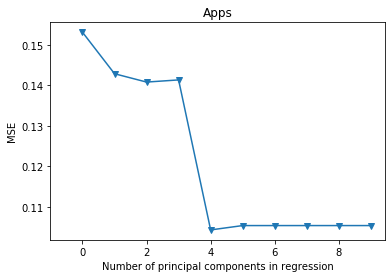

In [264]:
pca2 = PCA()

# Split into training and test sets
x_train, x_test , y_train, y_test = model_selection.train_test_split(x, y, test_size=0.2, random_state=1)

# Scale the data
x_reduced_train = pca2.fit_transform(scale(x_train))
n = len(x_reduced_train)

# 10-fold CV, with shuffle
kf_10 = model_selection.KFold( n_splits=10, shuffle=True, random_state=1)

mse = []

# Calculate MSE with only the intercept (no principal components in regression)
score = -1*model_selection.cross_val_score(regr, np.ones((n,1)), y_train.ravel(), cv=kf_10, scoring='neg_mean_squared_error').mean()    
mse.append(score)

# Calculate MSE using CV for the 10 principle components, adding one component at the time.
for i in np.arange(1,10 ):
    score = -1*model_selection.cross_val_score(regr, x_reduced_train[:,:i], y_train.ravel(), cv=kf_10, scoring='neg_mean_squared_error').mean()
    mse.append(score)

plt.plot(np.array(mse), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('MSE')
plt.title('Apps')
plt.xlim(xmin=-1);

In [261]:
x_reduced_test = pca2.transform(scale(x_test))[:,:10]

# Train regression model on training data 
regr = LinearRegression()
regr.fit(x_reduced_train[:,:10], y_train)

# Prediction with test data MSE,  MSE = 10
pred = regr.predict(x_reduced_test)
mean_squared_error(y_test, pred)

0.11983027842740769

C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Invalid number of components: 6

  FitFailedWarning)
C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Invalid number of components: 6

  FitFailedWarning)
C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Invalid number of components: 6

  FitFailedWarning)
C:\Users\Hamed\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-tes

(-1, 5.2)

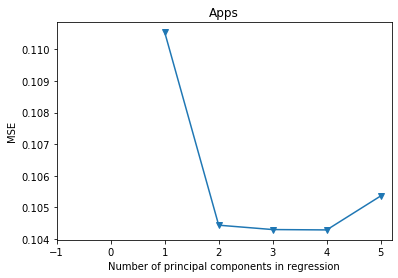

In [139]:
# 9F - fit a PLS model on the training set, find MSE, and show M

n = len(x_train)

# 10-fold CV, with shuffle
kf_10 = model_selection.KFold(n_splits=10, shuffle=True, random_state=1)

mse = []

for i in np.arange(1, 17):
    pls = PLSRegression(n_components=i)
    score = model_selection.cross_val_score(pls, scale(x_train), y_train, cv=kf_10, scoring='neg_mean_squared_error').mean()
    mse.append(-score)

# Plot results
plt.plot(np.arange(1, 17), np.array(mse), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('MSE')
plt.title('Apps')
plt.xlim(xmin=-1)

In [140]:
pls = PLSRegression(n_components= 3) # lowest MSE is at M=11
pls.fit(scale(x_train), y_train)

mean_squared_error(y_test, pls.predict(scale(x_test))) # test-error

0.11976872163195094

In [268]:
# Example 3: PCR on the data in Import Data 
import pandas as pd
import statsmodels.formula.api as smf
df1 = pd.read_csv('~/Documents/ELEN_520/TrafficDetectionData4.csv')
df = df1.loc[(df1['Light']>= 0) & (df1['Distance'] <= 12)]
df.head()

,Blue,Green,Red,Distance,Light,Color,ColorDetect,ColorNum
0,41.15,24.42,34.44,3,1,Blue,Yes,1
1,40.43,24.92,34.65,3,1,Blue,Yes,1
2,40.84,24.63,34.53,3,1,Blue,Yes,1
3,41.20,24.37,34.43,3,1,Blue,Yes,1
4,40.97,24.54,34.49,3,1,Blue,Yes,1


In [269]:
# Example 3: PCR on the data in Import Data 
# Choose Blue, Green, and Red as three predictors
# we standardize the predictors by subtracting the mean and dividing by the standard deviation
# use ddof=1 to find sample (instead of population) std dev
DOPROD_std = (df['Blue'] - np.mean(df['Blue']))/np.std(df['Blue'], ddof=1)
STOCK_std = (df['Green'] - np.mean(df['Green']))/np.std(df['Red'], ddof=1)
CONSUM_std = (df['Red'] - np.mean(df['Red']))/np.std(df['Red'], ddof=1)
B = np.vstack((DOPROD_std, STOCK_std))
B = np.vstack((B, CONSUM_std))
# equivalently find the covariance using method COV
S = np.cov(B)
print(S)
#find the eigenvalues and eigenvectors
from numpy import linalg as LA
[V, D] = LA.eig(S)
print(V) # eigenvalues
print(D)  # eigenvectors

[[ 1.         -0.38988181 -0.6783587 ]
 [-0.38988181  0.69182586 -0.275344  ]
 [-0.6783587  -0.275344    1.        ]]
[2.12872318e-08 1.68624011e+00 1.00558572e+00]
[[ 0.60273327  0.72698514  0.3289456 ]
 [ 0.56423371 -0.09680135 -0.81992062]
 [ 0.56422773 -0.67979563  0.46853492]]


In [270]:
C1 = 0.706 * DOPROD_std + 0.044 * STOCK_std + 0.707 * CONSUM_std
C2 = -0.036 * DOPROD_std + 0.999 * STOCK_std - 0.026 * CONSUM_std
C3 = -0.707 * DOPROD_std - 0.007 * STOCK_std + 0.707 * CONSUM_std
np.transpose(pd.DataFrame([C1, C2, C3]))

,0,1,2
0,0.129104,-0.227640,-0.338493
1,0.113494,-0.201146,-0.306725
2,0.122356,-0.216502,-0.324829
3,0.130319,-0.230266,-0.340529
4,0.125100,-0.221269,-0.330640
5,0.118035,-0.209096,-0.317344
6,0.125344,-0.221809,-0.333074
7,0.129886,-0.229758,-0.343692
8,0.129712,-0.229207,-0.339159
9,0.128159,-0.226563,-0.336786


In [141]:
# 9C - fit ridge regression mode; call out libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import scale 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error

In [142]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 477 entries, 0 to 476
Data columns (total 5 columns):
Blue        477 non-null float64
Green       477 non-null float64
Red         477 non-null float64
Distance    477 non-null int64
Light       477 non-null int64
dtypes: float64(3), int64(2)
memory usage: 18.7 KB


In [143]:
alphas = 10**np.linspace(10,-2,100)*0.5
alphas

array([5.00000000e+09, 3.78231664e+09, 2.86118383e+09, 2.16438064e+09,
       1.63727458e+09, 1.23853818e+09, 9.36908711e+08, 7.08737081e+08,
       5.36133611e+08, 4.05565415e+08, 3.06795364e+08, 2.32079442e+08,
       1.75559587e+08, 1.32804389e+08, 1.00461650e+08, 7.59955541e+07,
       5.74878498e+07, 4.34874501e+07, 3.28966612e+07, 2.48851178e+07,
       1.88246790e+07, 1.42401793e+07, 1.07721735e+07, 8.14875417e+06,
       6.16423370e+06, 4.66301673e+06, 3.52740116e+06, 2.66834962e+06,
       2.01850863e+06, 1.52692775e+06, 1.15506485e+06, 8.73764200e+05,
       6.60970574e+05, 5.00000000e+05, 3.78231664e+05, 2.86118383e+05,
       2.16438064e+05, 1.63727458e+05, 1.23853818e+05, 9.36908711e+04,
       7.08737081e+04, 5.36133611e+04, 4.05565415e+04, 3.06795364e+04,
       2.32079442e+04, 1.75559587e+04, 1.32804389e+04, 1.00461650e+04,
       7.59955541e+03, 5.74878498e+03, 4.34874501e+03, 3.28966612e+03,
       2.48851178e+03, 1.88246790e+03, 1.42401793e+03, 1.07721735e+03,
      

In [144]:
ridge = Ridge(normalize = True)
coefs = []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(x, y)
    coefs.append(ridge.coef_)
    
np.shape(coefs)

(100, 5)

Text(0, 0.5, 'weights')

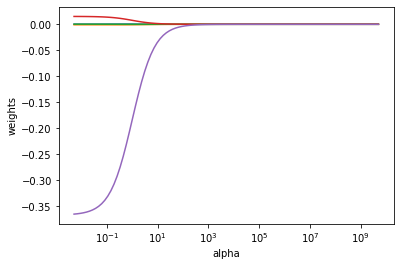

In [145]:
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [146]:
# Split data into training and test sets
x_train, x_test , y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)

In [147]:
ridge2 = Ridge(alpha = 2, normalize = True) # for alpha = 2 
ridge2.fit(x_train, y_train)             # Fit a ridge regression on the training data
pred2 = ridge2.predict(x_test)           # Use this model to predict the test data
print(pd.Series(ridge2.coef_, index = x.columns)) # Print coefficients
print(mean_squared_error(y_test, pred2))          # Calculate the test MSE

Blue        0.000524
Green      -0.000732
Red        -0.000149
Distance    0.005456
Light      -0.121942
dtype: float64
0.12260996781844281


In [148]:
ridge2 = Ridge(alpha = 0, normalize = True) # for alpha = 0 
ridge2.fit(x_train, y_train)             # Fit a ridge regression on the training data
pred2 = ridge2.predict(x_test)           # Use this model to predict the test data
print(pd.Series(ridge2.coef_, index = x.columns)) # Print coefficients
print(mean_squared_error(y_test, pred2))          # Calculate the test MSE

Blue       -0.679018
Green      -0.680507
Red        -0.679023
Distance    0.016913
Light      -0.373333
dtype: float64
0.10837959322269937
